In [14]:
import os
import scanpy as sc
import anndata as ad
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ==== Parameters ====
results_folder = "/Users/christoffer/work/karolinska/development/ST_BRICHOS/results"
output_folder = "/Users/christoffer/work/karolinska/development/ST_BRICHOS"
combined_path = os.path.join(output_folder, "combined_samples.h5ad")

# ==== Helper function ====
def harmonize_spatial_metadata(adata):
    """
    Adapt .uns['spatial'] for a multi-sample AnnData object.
    Also ensures .obsm['spatial'] is X=pxl_col, Y=pxl_row for correct orientation.
    """
    if "spatial" not in adata.uns:
        print("⚠️  No 'spatial' key found in .uns — skipping")
        return

    spatial_meta = adata.uns.pop("spatial")
    adata.uns["spatial_metadata_per_sample"] = spatial_meta
    adata.uns["spatial"] = {}

    for sample_id in adata.obs["sample"].unique():
        idx = adata.obs["sample"] == sample_id
        adata_sample = adata[idx].copy()

        # Correct spatial layout: [pxl_col, pxl_row] → [X, Y]
        if {"pxl_row_in_fullres", "pxl_col_in_fullres"}.issubset(adata_sample.obs.columns):
            adata.obsm["spatial"][idx] = adata_sample.obs[
                ["pxl_col_in_fullres", "pxl_row_in_fullres"]
            ].astype(float).values

        if sample_id in spatial_meta:
            adata.uns["spatial"][sample_id] = spatial_meta[sample_id]
        else:
            print(f"❌ No spatial metadata found for {sample_id}")

    print("✅ Spatial metadata harmonized")

# ==== Main logic ====
h5ad_files = [os.path.join(results_folder, f) for f in os.listdir(results_folder) if f.endswith(".h5ad")]

adatas = []
spatial_dict = {}

for file in h5ad_files:
    sample_name = os.path.basename(file).replace(".h5ad", "")
    adata = sc.read_h5ad(file)
    adata.obs["sample"] = sample_name
    adatas.append(adata)

    if "spatial" in adata.uns and sample_name in adata.uns["spatial"]:
        spatial_dict[sample_name] = adata.uns["spatial"][sample_name]

# Combine
adata_combined = ad.concat(
    adatas,
    join="outer",
    label="sample_id",
    keys=[a.obs["sample"][0] for a in adatas],
    index_unique="-"
)

# Add spatial metadata
adata_combined.uns["spatial"] = spatial_dict

# Safely convert observation columns
for col in ["array_row", "array_col", "pxl_row_in_fullres", "pxl_col_in_fullres", "in_tissue"]:
    if col in adata_combined.obs:
        adata_combined.obs[col] = pd.to_numeric(adata_combined.obs[col], errors="coerce").astype("Int64")

# Initialize .obsm['spatial'] with correct shape
adata_combined.obsm["spatial"] = np.zeros((adata_combined.n_obs, 2), dtype=float)

# Harmonize .uns["spatial"] and correctly populate obsm["spatial"]
harmonize_spatial_metadata(adata_combined)

# Save
adata_combined.write(combined_path)
print(f"✅ Combined AnnData written to {combined_path}")

✅ Spatial metadata harmonized
✅ Combined AnnData written to /Users/christoffer/work/karolinska/development/ST_BRICHOS/combined_samples.h5ad


In [35]:
adata = sc.read_h5ad('/Users/christoffer/work/karolinska/development/ST_BRICHOS/combined_samples.h5ad')

In [36]:
adata.X.toarra

<25671x19465 sparse matrix of type '<class 'numpy.float32'>'
	with 141659509 stored elements in Compressed Sparse Row format>

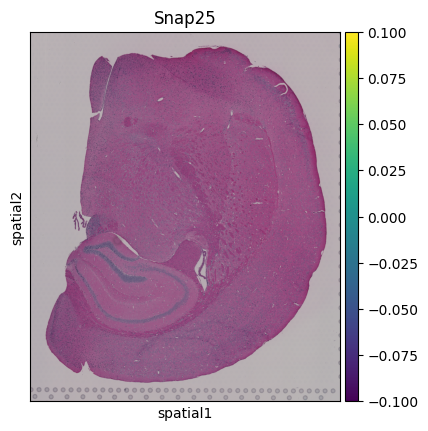

In [31]:
# Select a sample
sample_id = "P24215_101"
adata_sample = adata_combined[adata_combined.obs["sample"] == sample_id].copy()

# Attach the correct spatial info to .uns
adata_sample.uns["spatial"] = {sample_id: adata_combined.uns["spatial"][sample_id]}

# Plot spatial expression of a gene
sc.pl.spatial(
    adata_sample,
    color="Snap25",  # replace with your gene
    spot_size=500,
)

📍 Plotting sample: P24215_301


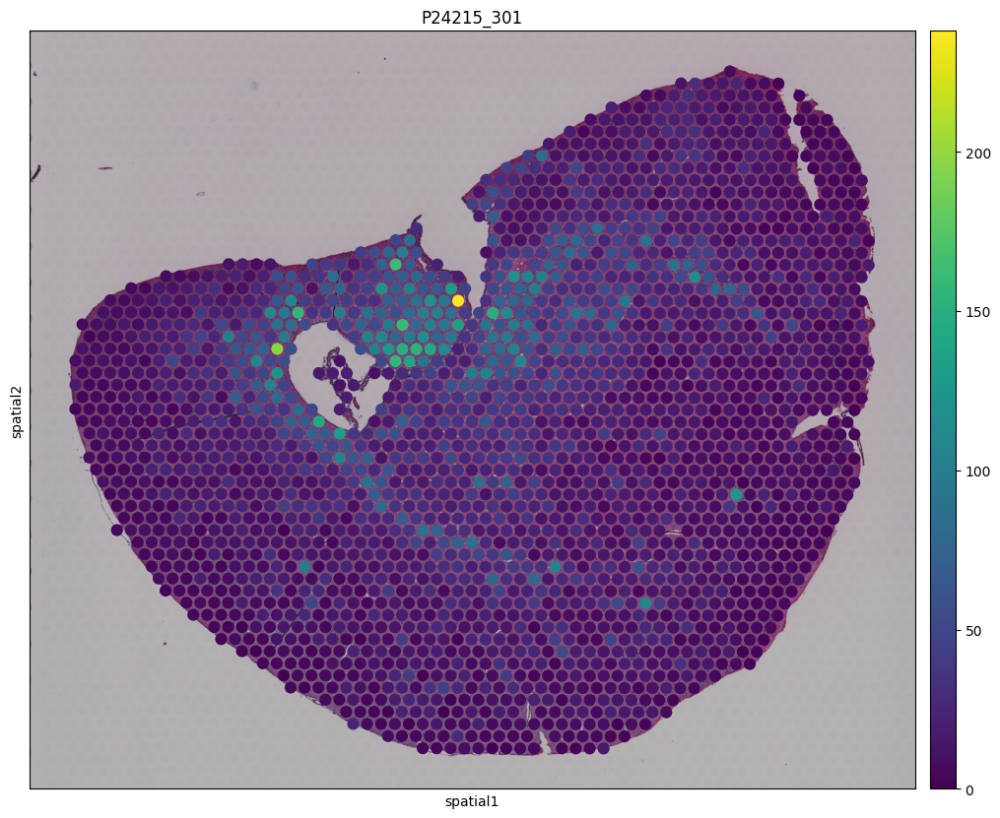

📍 Plotting sample: P28052_201


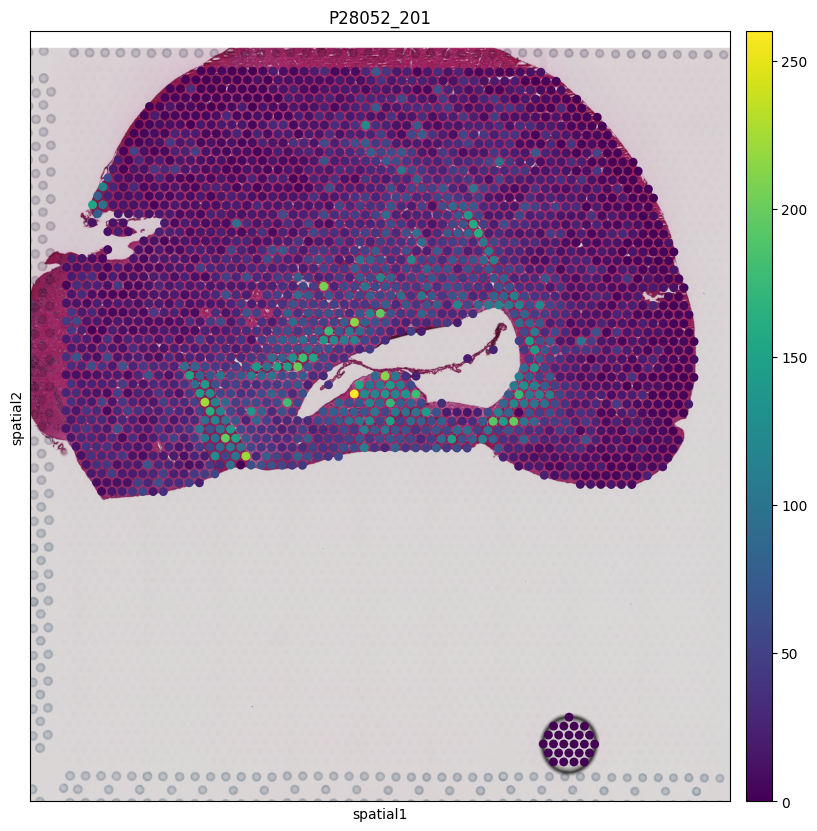

📍 Plotting sample: P24215_101


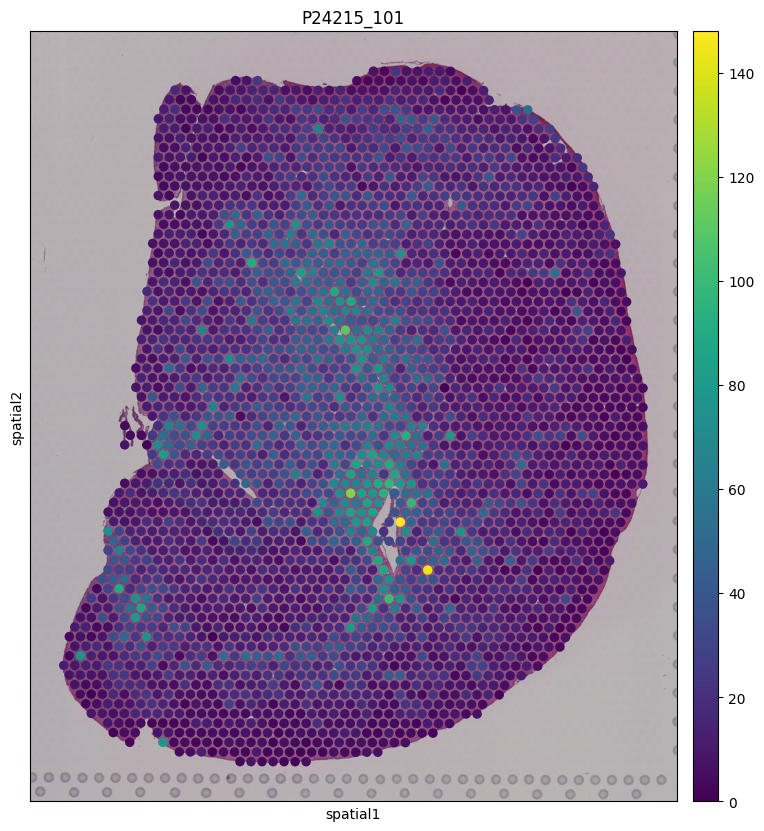

📍 Plotting sample: P28052_103


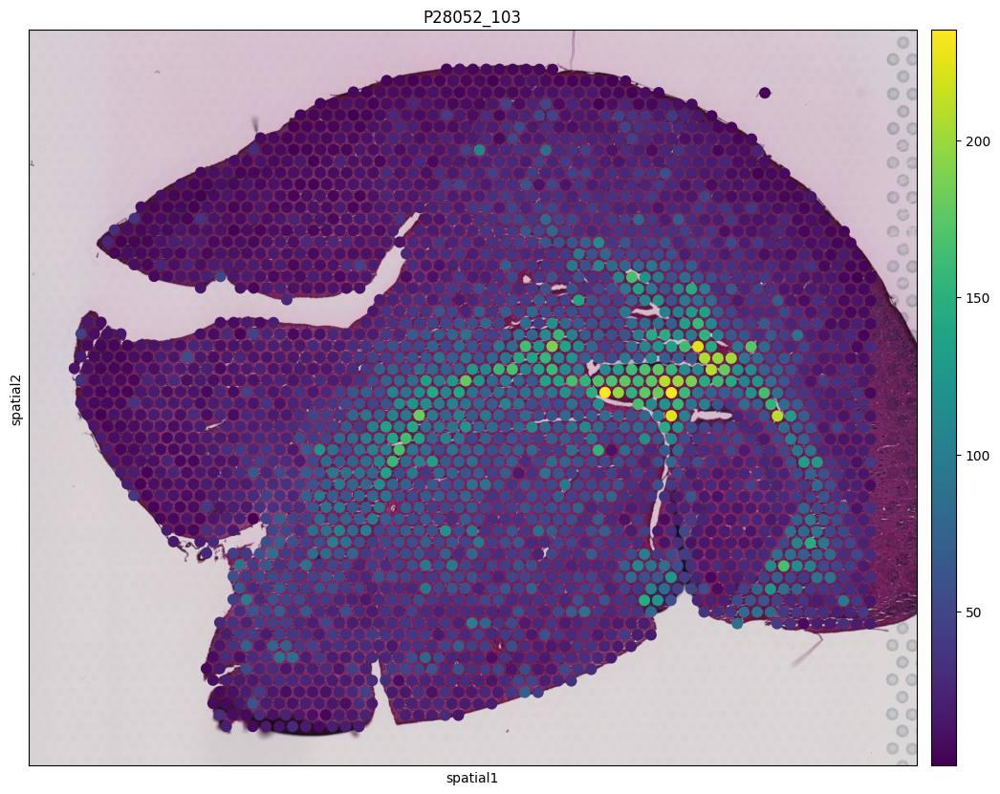

📍 Plotting sample: P28052_102


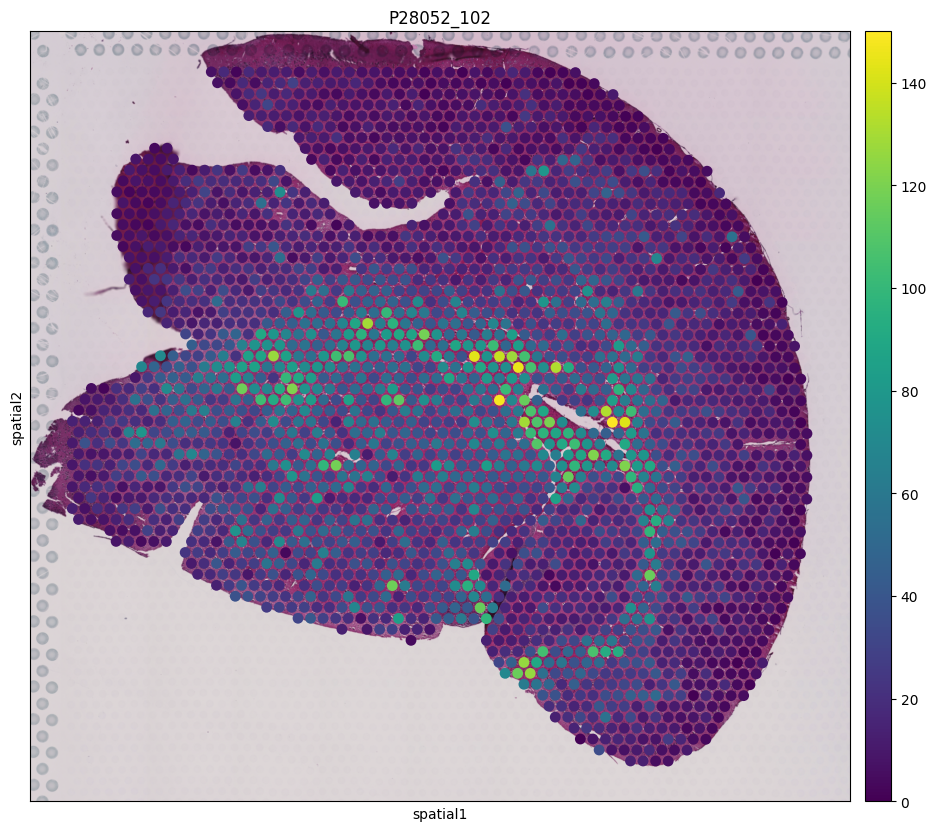

📍 Plotting sample: P28052_401


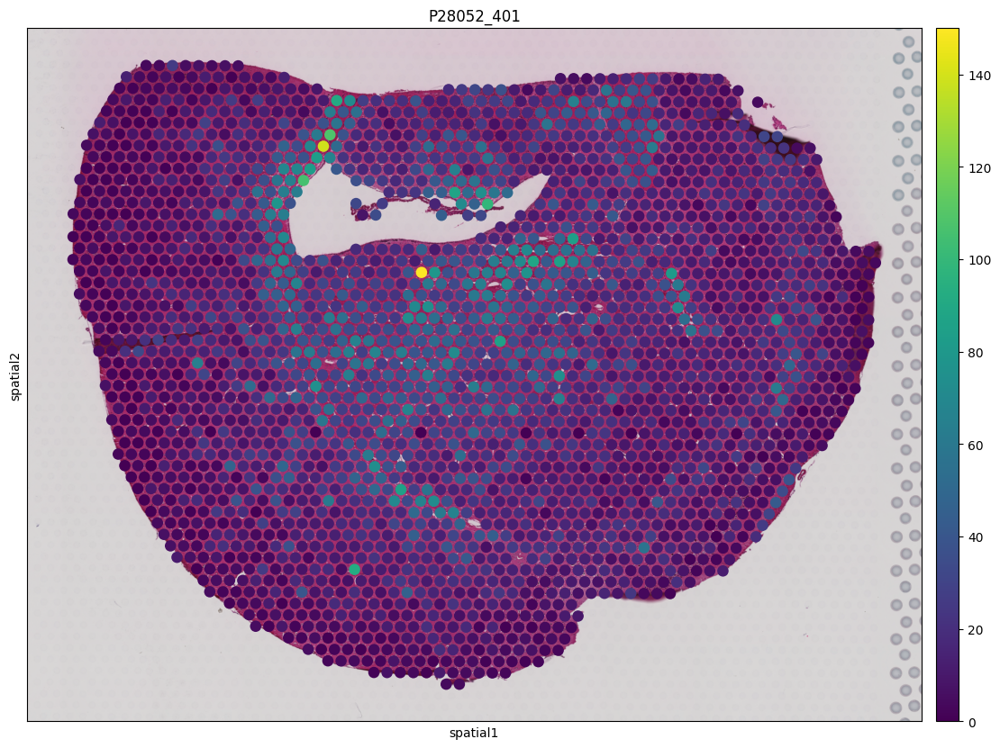

📍 Plotting sample: P24215_201


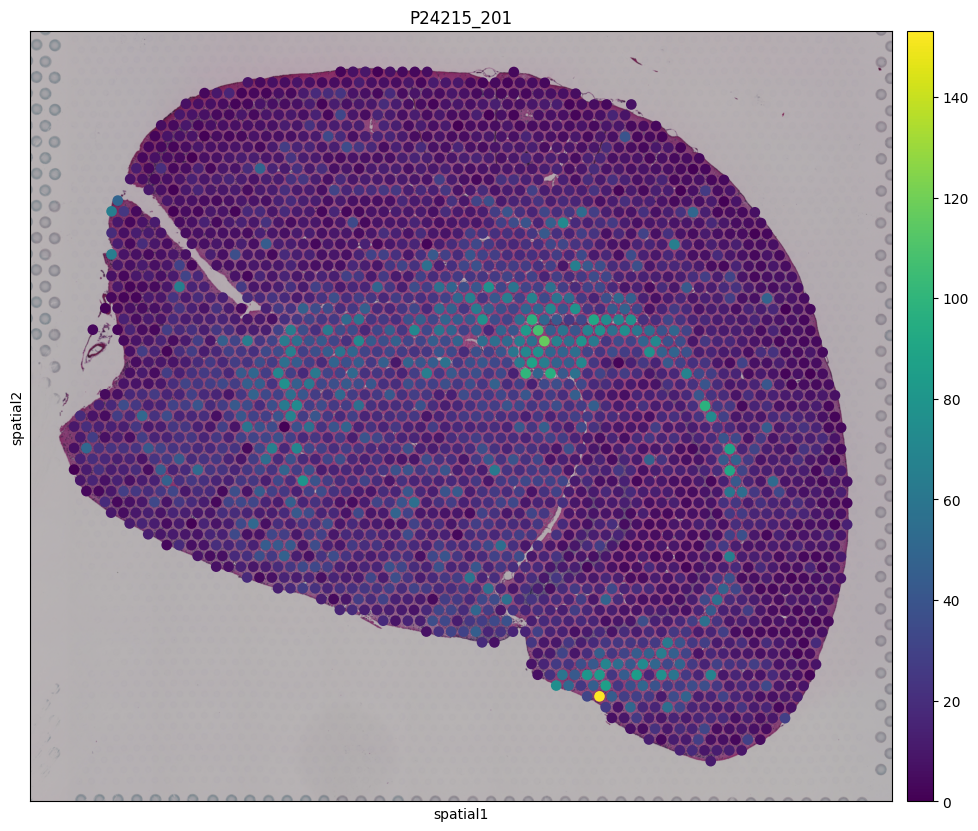

📍 Plotting sample: P28052_301


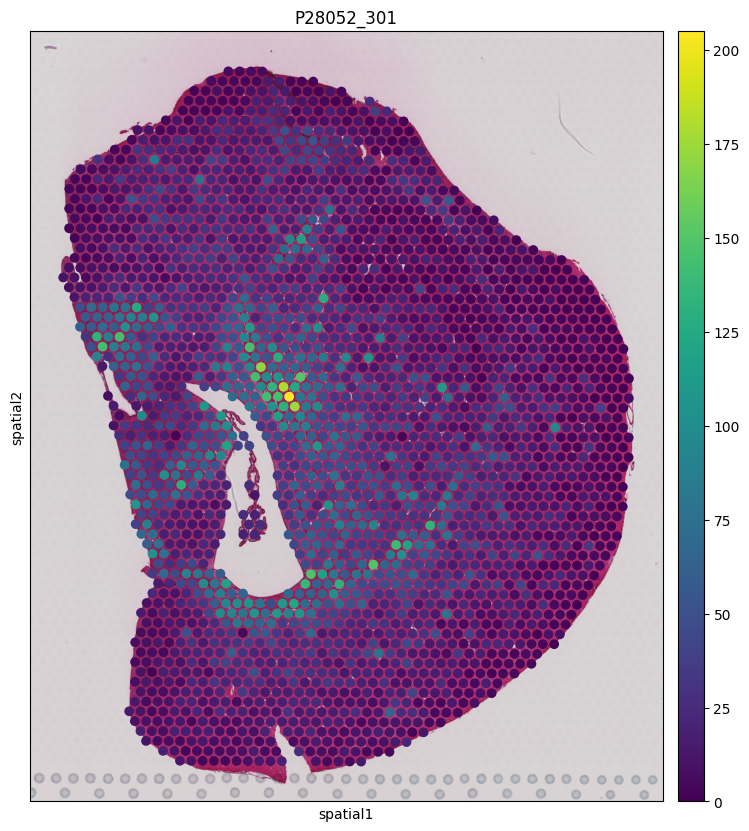

📍 Plotting sample: P28052_202


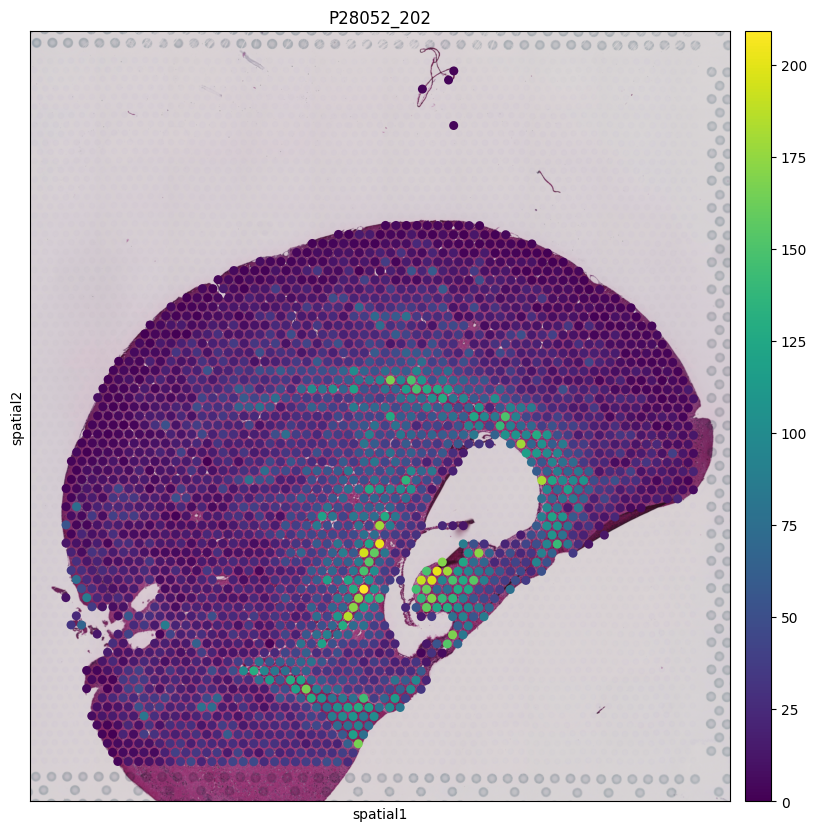

📍 Plotting sample: P28052_203


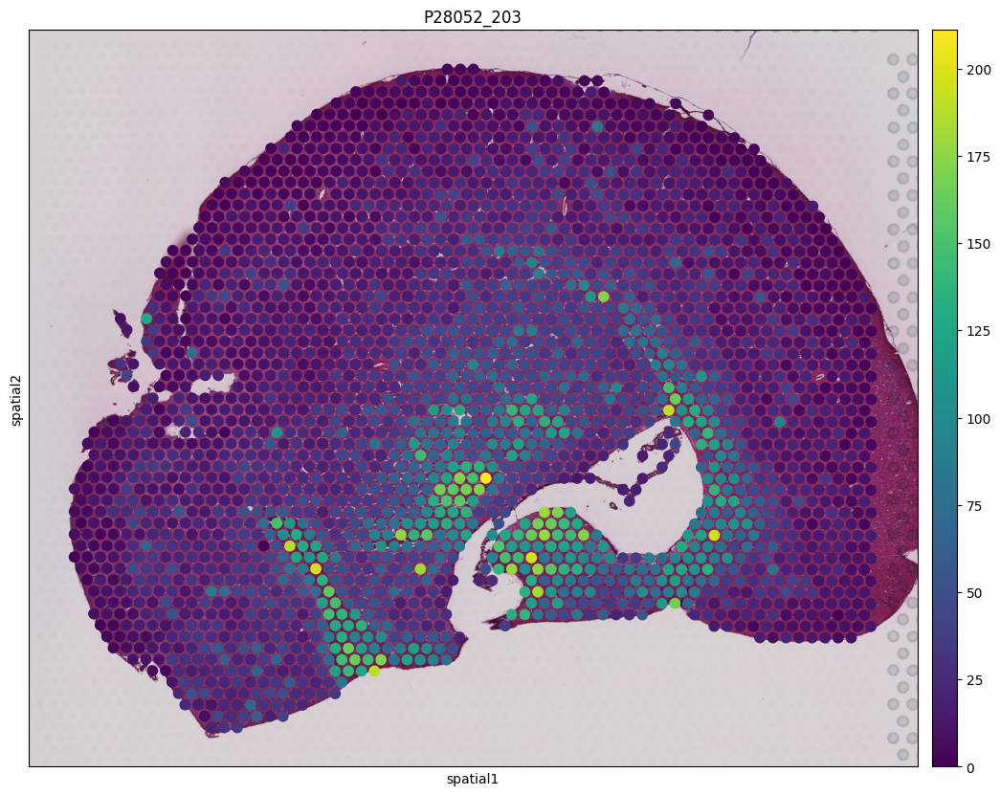

In [32]:
for run in adata.obs['sample_id'].unique():
    print(f"📍 Plotting sample: {run}")
    
    ad_int = adata[adata.obs['sample_id'] == run].copy()
    
    # Patch .uns["spatial"] so Scanpy knows which spatial metadata to use
    if "spatial_metadata_per_sample" in adata.uns and run in adata.uns["spatial_metadata_per_sample"]:
        ad_int.uns["spatial"] = {run: adata.uns["spatial_metadata_per_sample"][run]}
    else:
        print(f"⚠️  No spatial metadata found for {run}")
        continue

    with plt.rc_context({'figure.figsize': (20, 10)}):
        sc.pl.spatial(ad_int, spot_size=500, color='Plp1', title=run)
        plt.show()

In [34]:
# Basic filtering (optional but can help speed)
sc.pp.filter_cells(adata_combined, min_genes=200)
sc.pp.filter_genes(adata_combined, min_cells=3)

# Normalize total counts per cell
#sc.pp.normalize_total(adata_combined, target_sum=1e4)

# Log1p transform
#sc.pp.log1p(adata_combined)

# Find highly variable genes (per batch = sample is recommended for spatial data)
#sc.pp.highly_variable_genes(adata_combined, flavor="seurat_v3", batch_key="sample_id", n_top_genes=2000)

# Subset to HVGs
#adata_combined = adata_combined[:, adata_combined.var.highly_variable]

# Scale
sc.pp.scale(adata_combined, max_value=10)

# PCA
sc.tl.pca(adata_combined, svd_solver='arpack')

# Neighborhood graph
sc.pp.neighbors(adata_combined, n_neighbors=15, n_pcs=30)

# UMAP
sc.tl.umap(adata_combined)

# Clustering
sc.tl.leiden(adata_combined, resolution=0.5)  # You can adjust resolution

# Plot UMAP
sc.pl.umap(adata_combined, color=["leiden", "sample_id"])

SyntaxError: positional argument follows keyword argument (3309118560.py, line 21)